# Matsuno 2D numerical solver
# The inital conditions are defined so as the system evolves to MRG wave  steady state solutions

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from numba import jit


In [5]:
# Grid setup (non-dimensional)
Ny, Nx = 101, 201
Ly, Lx = 10.0, 20.0   # y from -5 to 5, x from -10 to 10
y = np.linspace(-Ly/2, Ly/2, Ny)
x = np.linspace(-Lx/2, Lx/2, Nx)
dx = x[1] - x[0]
dy = y[1] - y[0]

# Time stepping
dt = 0.01
nt = 2000  # number of time steps
save_every = 10  # save every nth step


In [6]:
# Initialize fields
phi = np.zeros((Ny, Nx))
u = np.zeros((Ny, Nx))
v = np.zeros((Ny, Nx))

# Initial condition for MRG wave (antisymmetric phi and u, symmetric v)
Y, X = np.meshgrid(y, x, indexing='ij')
phi = np.exp(-X**2) * Y * np.exp(-Y**2)
u = np.exp(-X**2) * Y * np.exp(-Y**2)
v = np.exp(-X**2) * np.exp(-Y**2)  # symmetric

# Storage
phi_all = []
u_all = []
v_all = []


In [7]:
@jit(nopython=True)
def step(phi, u, v, dx, dy, dt):
    Ny, Nx = phi.shape
    phi_new = np.copy(phi)
    u_new = np.copy(u)
    v_new = np.copy(v)

    for j in range(1, Ny-1):
        for i in range(1, Nx-1):
            dphi_dx = (phi[j, i+1] - phi[j, i-1]) / (2*dx)
            dphi_dy = (phi[j+1, i] - phi[j-1, i]) / (2*dy)

            du_dt = -dphi_dx + v[j, i]
            dv_dt = -dphi_dy - u[j, i]
            dphi_dt = -((u[j, i+1] - u[j, i-1]) / (2*dx) + (v[j+1, i] - v[j-1, i]) / (2*dy))

            u_new[j, i] += dt * du_dt
            v_new[j, i] += dt * dv_dt
            phi_new[j, i] += dt * dphi_dt

    return phi_new, u_new, v_new


In [8]:
for n in range(nt):
    phi, u, v = step(phi, u, v, dx, dy, dt)
    if n % save_every == 0:
        phi_all.append(phi.copy())
        u_all.append(u.copy())
        v_all.append(v.copy())


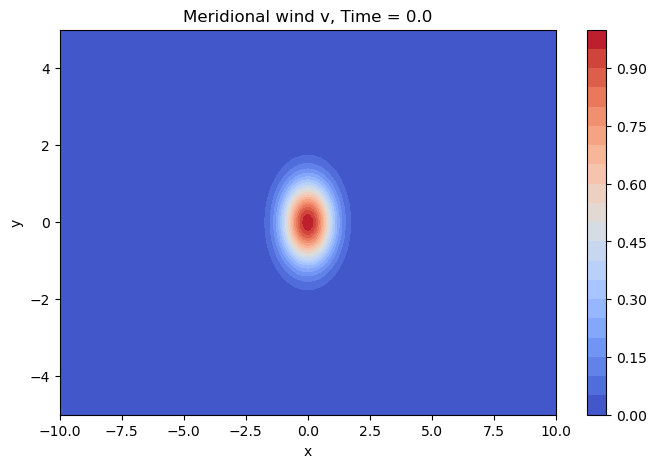

In [9]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Create figure and initial plot
fig, ax = plt.subplots(figsize=(8, 5))
contour = ax.contourf(X, Y, v_all[0], levels=21, cmap='coolwarm')
cb = fig.colorbar(contour)
ax.set_xlabel("x")
ax.set_ylabel("y")
title = ax.set_title("Time = 0")

# Function to update plot for each frame
def update(frame):
    ax.clear()
    contour = ax.contourf(X, Y, v_all[frame], levels=21, cmap='coolwarm')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(f"Meridional wind v, Time = {frame * dt:.1f}")
    return contour

# Create animation (note: blit=False for contourf)
anim = FuncAnimation(fig, update, frames=len(v_all), interval=100, blit=False)

# Display in notebook
HTML(anim.to_jshtml())


In [10]:
anim.save("mrg_evolution.mp4", writer='ffmpeg', fps=10)


MovieWriter ffmpeg unavailable; using Pillow instead.


ValueError: unknown file extension: .mp4